# Prompt Generator for Stable Diffusion

```{note}
Install ekorpkit package first.

Set logging level to Warning, if you don't want to see verbose logging.

If you run this notebook in Colab, set Hardware accelerator to GPU.
```

```python
%pip install -U --pre ekorpkit[art]

exit()
```

## Preparing the environment


In [1]:
%config InlineBackend.figure_format='retina'
%load_ext autotime

from ekorpkit import eKonf

eKonf.setLogger("WARNING")
eKonf.set_cuda(device=0)
print("version:", eKonf.__version__)

is_colab = eKonf.is_colab()
print("is colab?", is_colab)
if is_colab:
    eKonf.mount_google_drive()
project_dir = eKonf.set_workspace(workspace="/content/drive/MyDrive/workspace/", project="ekorpkit-book")
print("project_dir:", project_dir)

INFO:ekorpkit.base:Setting cuda device to ['A100-SXM4-40GB (id:0)']
INFO:ekorpkit.base:Setting EKORPKIT_WORKSPACE_ROOT to /content/drive/MyDrive/workspace/
INFO:ekorpkit.base:Setting EKORPKIT_PROJECT to ekorpkit-book
INFO:ekorpkit.base:Loaded .env from /workspace/projects/ekorpkit-book/config/.env


version: 0.1.40.post0.dev9
is colab? False
project_dir: /content/drive/MyDrive/workspace/projects/ekorpkit-book
time: 3.43 s (started: 2022-11-10 09:47:29 +00:00)


## Load a Generator and Generate Prompts

To download a certain dataset or model checkpoint, you may need to provide a HuggingFace API token. You can get one from [here](https://huggingface.co/settings/token).

```python

import os

# Set HuggingFace API token
os.environ["HF_USER_ACCESS_TOKEN"] = "YOUR_TOKEN"
```

In [2]:
from ekorpkit.models.art.prompt import PromptGenerator

pgen = PromptGenerator(verbose=False)

2022-11-10 09:47:35.832143: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


time: 6.51 s (started: 2022-11-10 09:47:34 +00:00)


### Loading a model

Before loading a model, you need to train a model first. To train a model, refer to the [Training a Generator](#training-a-generator) section.

In [4]:
# ekorpkit/stable-prompts
pgen.load_model(model_name="ekorpkit/stable-prompts")


time: 4.97 s (started: 2022-11-10 07:43:28 +00:00)


### Generating prompts

You can generate prompts using the `generate_prompts` function. The function takes the following arguments:

- `prompt`: The prompt to be used for generating prompts. If `None`, the prompt will be generated automatically.
- `num_prompts_to_generate`: The number of prompts to be generated.
- `generate_images`: Whether to generate images for the prompts.
- `num_samples`: The number of images to be generated for each prompt.
- For other arguments, refer to the following code.


In [5]:
eKonf.print(pgen.generate_config)

{'check_start_token': True,
 'max_prompt_length': 50,
 'min_prompt_length': 30,
 'num_prompts_to_generate': 10,
 'prompt': None,
 'temperature': 1.2,
 'top_k': 70,
 'top_p': 0.9}
time: 1.18 ms (started: 2022-11-10 07:43:34 +00:00)


Prompt: people looking out a lonely city street in the snow, concept art portrait of a blonde anime boy with blond hair, high detail, digital art, by greg rutkowski


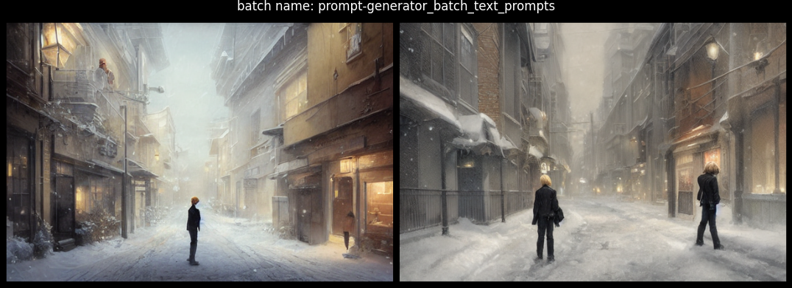

Prompt: people looking out a lonely city street, artgerm and greg rutkowski and alphonse mucha, a single glowing white male wolf with blue fur, fur, wolf face, ultra realistic, concept art, intricate details


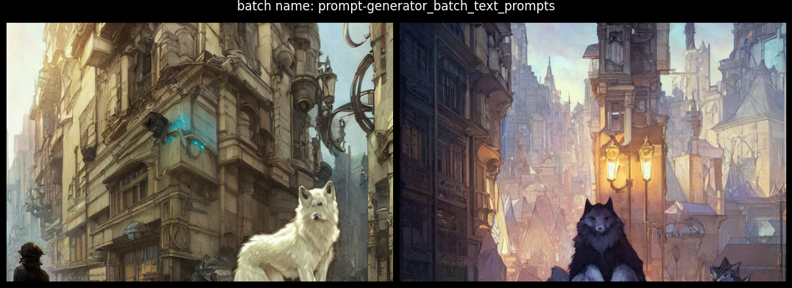

Prompt: people looking out a lonely city street, trending on artstation by Artgerm and Greg Rutkowski and Alphonse Mucha, 8k, HD


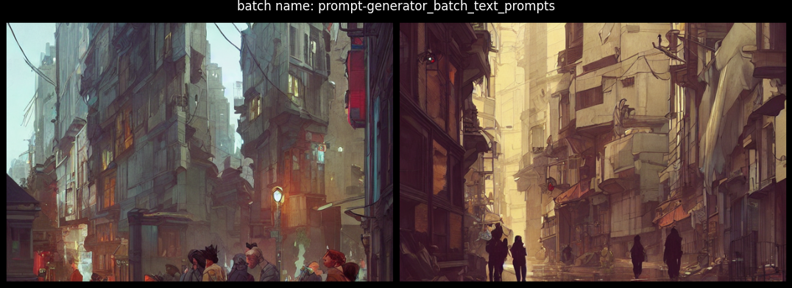

time: 1min 6s (started: 2022-11-10 07:49:23 +00:00)


In [10]:
prompts = pgen.generate_prompts(
    prompt="people looking out a lonely city street",
    num_prompts_to_generate=3,
    generate_images=True,
    num_samples=2,
)

### Generating images for prompts

Prompt: people looking out a lonely city street corner. cityscape. By Greg Rutkowski, Ilya Kuvshinov, WLOP, Stanley Artgerm Lau, Ruan Jia and Fenghua Zhong, trending on ArtStation


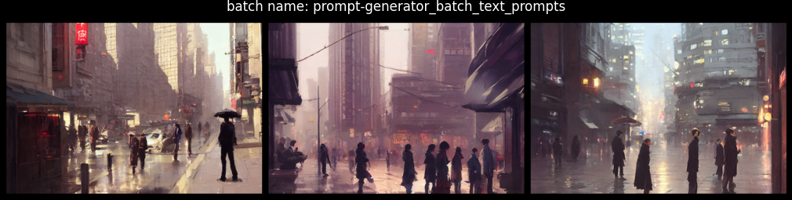

Prompt: people looking out a lonely city street below a lake on a white background, artstation, concept art, matte painting by craig mullins and Anato Finnstark, high detail, volumetric lighting, octane render, 4K resolution


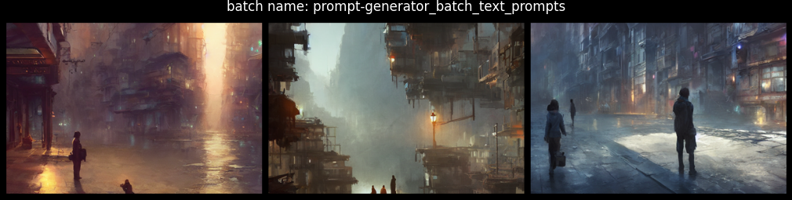

Prompt: people looking out a lonely city street at sunset, fantasy art by greg rutkowski and craig mullins, trending on artstation


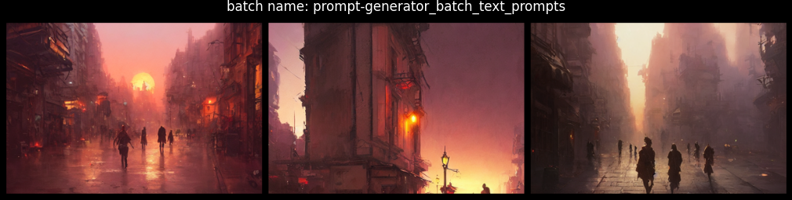

time: 1min 36s (started: 2022-11-10 07:46:05 +00:00)


In [8]:
results = pgen.generate_images(
    prompts=prompts,
    num_samples=3,
)

### Generating images for one prompt

Prompt: people looking out a lonely city street in the snow, concept art portrait of a blonde anime boy with blond hair, high detail, digital art, by greg rutkowski


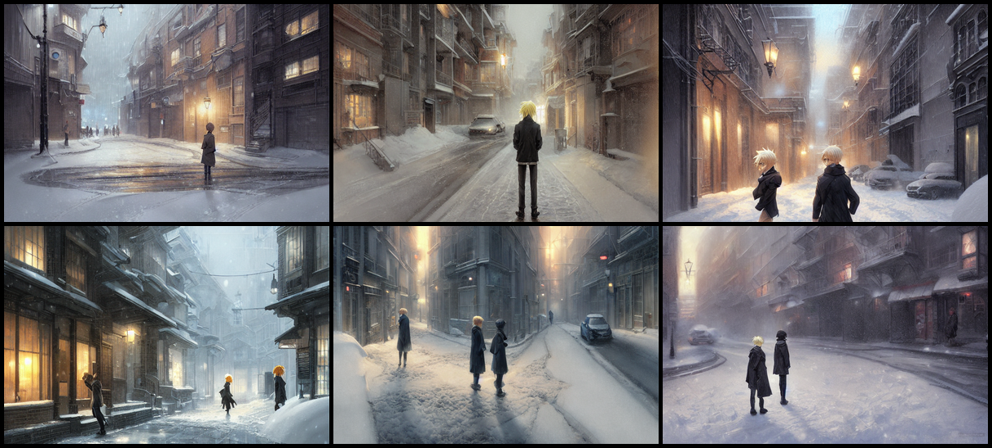

time: 1min 30s (started: 2022-11-10 07:51:57 +00:00)


In [12]:
results = pgen.imagine(
    text_prompts=prompts[0],
    num_samples=6,
    num_inference_steps=150,
    guidance_scale=10,
)

## Training a Generator

### Preparing a dataset

You can use any dataset you want. However, the dataset should be in the format of [HuggingFace Datasets](https://huggingface.co/docs/datasets/).

1. Using a dataset from HuggingFace Hub

In [3]:
dataset = pgen.load_dataset("Gustavosta/Stable-Diffusion-Prompts")
dataset

  0%|          | 0/2 [00:00<?, ?it/s]

DatasetDict({
    train: Dataset({
        features: ['Prompt'],
        num_rows: 73718
    })
    test: Dataset({
        features: ['Prompt'],
        num_rows: 8192
    })
})

time: 4.75 s (started: 2022-11-10 09:47:44 +00:00)


In [5]:
pgen.train_config.shuffle_prompts = False
pgen.trainer_config.num_train_epochs = 1
pgen.trainer_config.logging_steps = 1000
model_name = "ekorpkit/stable-prompts"

pgen.train(
    model_name=model_name,
    dataset=dataset,
    prompt_column="Prompt",
    split="train",
)

  0%|          | 0/8 [00:00<?, ?ba/s]

PyTorch: setting up devices
loading configuration file https://huggingface.co/distilgpt2/resolve/main/config.json from cache at /content/drive/MyDrive/workspace/projects/ekorpkit-book/disco-imagen/cache/f985248d2791fcff97732e4ee263617adec1edb5429a2b8421734c6d14e39bee.422318838d1ec4e061efb4ea29671cb2a044e244dc69229682bebd7cacc81631
Model config GPT2Config {
  "_name_or_path": "distilgpt2",
  "_num_labels": 1,
  "activation_function": "gelu_new",
  "architectures": [
    "GPT2LMHeadModel"
  ],
  "attn_pdrop": 0.1,
  "bos_token_id": 50256,
  "embd_pdrop": 0.1,
  "eos_token_id": 50256,
  "id2label": {
    "0": "LABEL_0"
  },
  "initializer_range": 0.02,
  "label2id": {
    "LABEL_0": 0
  },
  "layer_norm_epsilon": 1e-05,
  "model_type": "gpt2",
  "n_ctx": 1024,
  "n_embd": 768,
  "n_head": 12,
  "n_inner": null,
  "n_layer": 6,
  "n_positions": 1024,
  "reorder_and_upcast_attn": false,
  "resid_pdrop": 0.1,
  "scale_attn_by_inverse_layer_idx": false,
  "scale_attn_weights": true,
  "summar

Step,Training Loss
1000,3.398000
2000,2.720500
3000,2.546200
4000,2.450300
5000,2.351200
6000,2.323600
7000,2.261700
8000,2.247700
9000,2.230900




Training completed. Do not forget to share your model on huggingface.co/models =)




train/epoch,▁▁▂▂▃▄▅▅▆▇██
train/global_step,▁▁▂▂▃▄▅▆▆▇██
train/learning_rate,██▇▇▆▅▄▃▃▂▁
train/loss,█▄▄▂▂▂▁▁▁▁▁
train/total_flos,▁
train/train_loss,▁
train/train_runtime,▁
train/train_samples_per_second,▁
train/train_steps_per_second,▁
train/epoch,1.0
train/global_step,9215


Configuration saved in /content/drive/MyDrive/workspace/projects/ekorpkit-book/disco-imagen/models/ekorpkit/stable-prompts/config.json
Model weights saved in /content/drive/MyDrive/workspace/projects/ekorpkit-book/disco-imagen/models/ekorpkit/stable-prompts/pytorch_model.bin


time: 19min 34s (started: 2022-11-10 09:51:17 +00:00)


Prompt: people looking out a lonely city street, dark, dystopian, concept art, ambient lighting concept art ilya kuvshinov, arthur mores, pixar and ethereal, atmospheric, colorful, trending on artstation


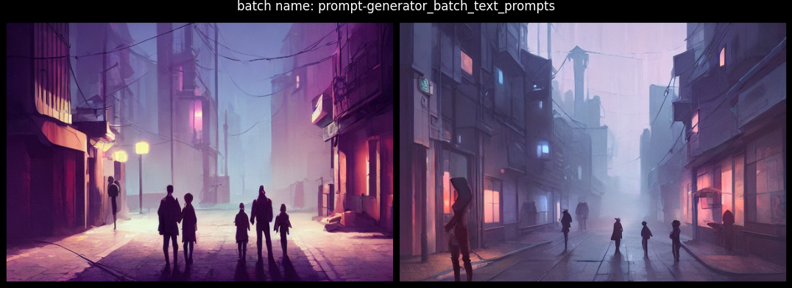

Prompt: people looking out a lonely city street, concept art by greg rutkowskirein and jim kehan and greg rutkowski and zeremy lipkin and artgerm and luis royo hyper detailed,


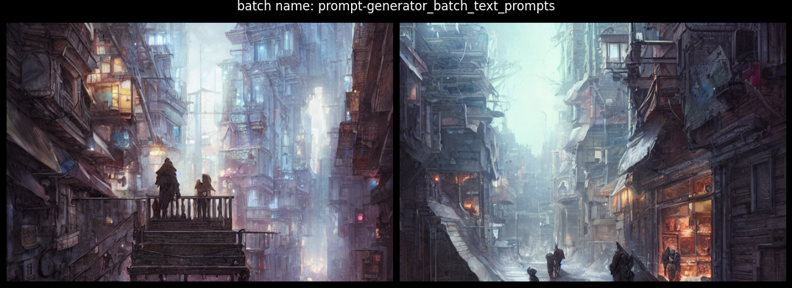

time: 1min 14s (started: 2022-11-10 10:11:23 +00:00)


In [6]:
pgen.load_model(model_name=model_name)
prompts = pgen.generate_prompts(
    prompt="people looking out a lonely city street",
    num_prompts_to_generate=2,
    generate_images=True,
    num_samples=2,
)

2. Using a dataset from a text file

In [3]:
prompt_uri = "https://raw.githubusercontent.com/entelecheia/ekorpkit-book/main/assets/data/prompt_parrot.txt"
dataset = pgen.load_dataset("text", data_files=prompt_uri)
dataset

  0%|          | 0/1 [00:00<?, ?it/s]

DatasetDict({
    train: Dataset({
        features: ['text'],
        num_rows: 185
    })
})

time: 1.29 s (started: 2022-11-10 09:41:31 +00:00)


In [4]:
eKonf.print(pgen.train_config)
eKonf.print(pgen.trainer_config)

{'batch_size': 10000,
 'num_shuffles': 4,
 'padding': 'max_length',
 'pretrained_model_name_or_path': 'distilgpt2',
 'prompt_column': 'Prompt',
 'shuffle_prompts': True,
 'split': 'train'}
{'logging_steps': 200,
 'num_train_epochs': 1,
 'overwrite_output_dir': True,
 'per_device_train_batch_size': 1,
 'prediction_loss_only': True,
 'report_to': 'wandb',
 'run_name': 'ekorpkit/stable-prompts',
 'save_steps': 0,
 'seed': None}
time: 2.66 ms (started: 2022-11-10 09:41:37 +00:00)


In [5]:
pgen.train_config.shuffle_prompts = False
pgen.trainer_config.num_train_epochs = 3
model_name="ekorpkit/prompt_parrot"

pgen.train(model_name=model_name, dataset=dataset, prompt_column="text")

  0%|          | 0/1 [00:00<?, ?ba/s]

***** Running training *****
  Num examples = 185
  Num Epochs = 3
  Instantaneous batch size per device = 1
  Total train batch size (w. parallel, distributed & accumulation) = 8
  Gradient Accumulation steps = 1
  Total optimization steps = 72
Automatic Weights & Biases logging enabled, to disable set os.environ["WANDB_DISABLED"] = "true"
wandb: Currently logged in as: entelecheia. Use `wandb login --relogin` to force relogin


Step,Training Loss




Training completed. Do not forget to share your model on huggingface.co/models =)




train/epoch,▁
train/global_step,▁
train/total_flos,▁
train/train_loss,▁
train/train_runtime,▁
train/train_samples_per_second,▁
train/train_steps_per_second,▁
train/epoch,3.0
train/global_step,72
train/total_flos,145019696578560.0
train/train_loss,8.11367


Configuration saved in /content/drive/MyDrive/workspace/projects/ekorpkit-book/disco-imagen/models/ekorpkit/prompt_parrot/config.json
Model weights saved in /content/drive/MyDrive/workspace/projects/ekorpkit-book/disco-imagen/models/ekorpkit/prompt_parrot/pytorch_model.bin


time: 1min 32s (started: 2022-11-10 09:42:17 +00:00)


Prompt: people looking out a lonely city street. vibrant nightscape landscape by Jean Eichler & Tom Riezzler, paintingstation paintingine de Jean du Fontaine


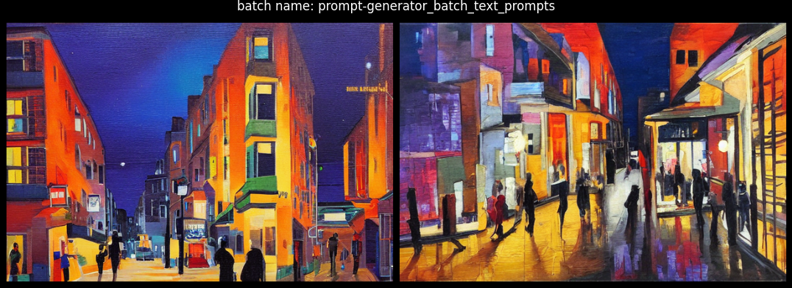

Prompt: people looking out a lonely city street street in a beautiful landscape by Steven Adams, lushly, and landscapes by Robert F. Bennett, The Lost and Skyward, a matte art by Alex Turner, matte painterabby, pixelism


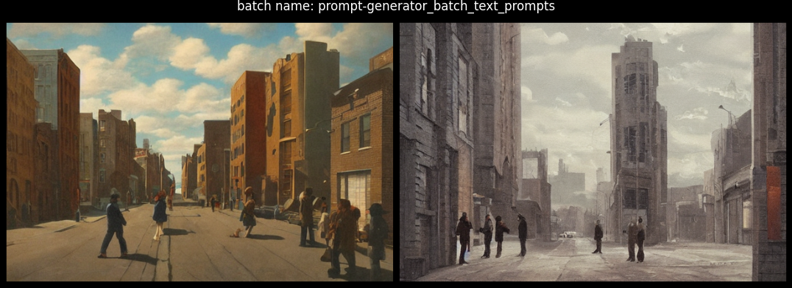

time: 1min 14s (started: 2022-11-10 09:43:50 +00:00)


In [6]:
pgen.load_model(model_name=model_name)
prompts = pgen.generate_prompts(
    prompt="people looking out a lonely city street",
    num_prompts_to_generate=2,
    generate_images=True,
    num_samples=2,
)

## References

- [Gustavosta/Stable-Diffusion-Prompts](https://huggingface.co/datasets/Gustavosta/Stable-Diffusion-Prompts)